(968, 1292, 3)
(968, 1292)


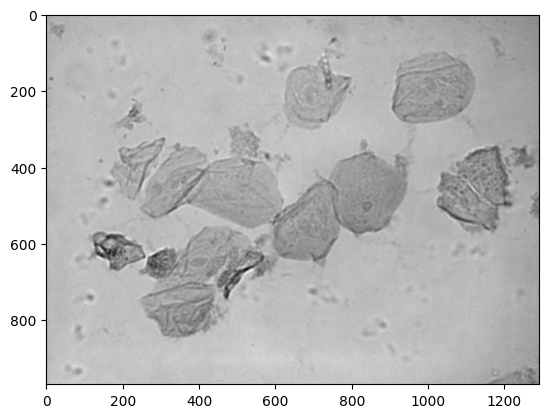

In [1]:
import cv2 as cv
import numpy as np
import io
from matplotlib import pyplot as plt
import math

img = plt.imread('A1 - P10 copy.jpg')
print(img.shape)
assert img is not None, "file could not be read, check with os.path.exists()"
gimg = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
rows,cols = gimg.shape
plt.imshow(gimg, 'gray')
print(gimg.shape)

In [2]:
laplacian_kernel = np.array([[-1, -1, -1],
                              [-1, 8, -1],
                              [-1, -1, -1]])

laplacian_kernel_1 = np.array([[0, 1, 0],
                              [1, -4, 1],
                              [0, 1, 0]])

laplacian_kernel_2 = np.array([[1, 1, 1],
                              [1, -8, 1],
                              [1, 1, 1]])

laplacian_kernel_3 = np.array([[0, -1, 0],
                              [-1, 4, -1],
                              [0, -1, 0]])


mask_V = np.array([[-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]])

mask_H = np.array([[-1, -2, -1],
                      [0, 0, 0],
                     [1, 2, 1]])

bs = 1
ext_gimg = cv.copyMakeBorder(gimg,bs,bs,bs,bs,cv.BORDER_REPLICATE)



sobel_H = np.zeros((rows, cols), dtype="int")
sobel_V = np.zeros((rows, cols), dtype="int")
laplacian = np.zeros((rows, cols), dtype="int")

elements = (bs+bs+1)*(bs+bs+1)
for y in np.arange(bs, rows + bs):
    for x in np.arange(bs, cols + bs):
        roi = ext_gimg[y - bs:y + bs + 1, x - bs:x + bs + 1]
        mult = mask_V * roi
        sobel_V[y - bs, x - bs] = mult.sum()
        mult = mask_H * roi
        sobel_H[y - bs, x - bs] = mult.sum()
        mult = laplacian_kernel_3 * roi
        laplacian[y - bs, x - bs] = mult.sum()
grad = sobel_V + sobel_H


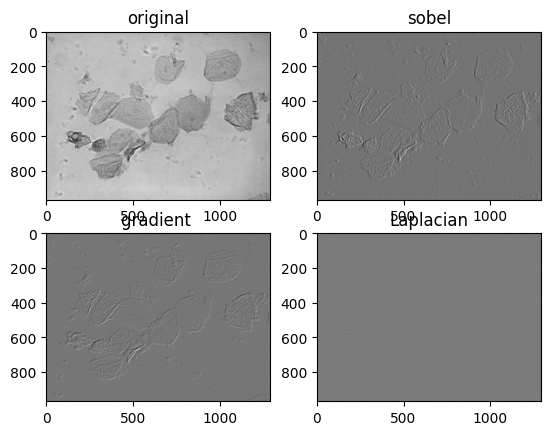

In [3]:
plt.subplot(221),plt.imshow(gimg,'gray'),plt.title('original')
plt.subplot(223),plt.imshow(grad,'gray'),plt.title('gradient ')
plt.subplot(224),plt.imshow(laplacian,'gray'),plt.title('Laplacian')
plt.subplot(222),plt.imshow(sobel_V,'gray'),plt.title('sobel')
plt.show()

In [4]:
sobel_x = cv.Sobel(gimg, cv.CV_64F, 1, 0)
sobel_y = cv.Sobel(gimg, cv.CV_64F, 0, 1)

magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
direcao = np.arctan2(sobel_y, sobel_x) * 180 / np.pi

acumulacao = np.zeros_like(gimg)

In [5]:
for i in range(gimg.shape[0]):
    for j in range(gimg.shape[1]):
        # Obter a direção do gradiente no pixel atual
        direcao_pixel = direcao[i, j]

        # Obter os pixels vizinhos na direção do gradiente
        vizinhos = [(i-1, j-1), (i-1, j), (i-1, j+1), (i, j-1), (i, j+1), (i+1, j-1), (i+1, j), (i+1, j+1)]

        # Encontrar o pixel vizinho com menor altitude (maior valor de acumulação)
        menor_altitude = acumulacao[i, j]
        menor_indice = (i, j)

        for x, y in vizinhos:
            if 0 <= x < gimg.shape[0] and 0 <= y < gimg.shape[1]:
                if acumulacao[x, y] < menor_altitude:
                    menor_altitude = acumulacao[x, y]
                    menor_indice = (x, y)

        # Adicionar a magnitude do gradiente à acumulação no pixel atual
        acumulacao[i, j] = magnitude[i, j] + menor_altitude

In [6]:
#ajuste do limiar
bordas = acumulacao > 12
img_result = gimg + bordas

(<Axes: title={'center': 'riverbed'}>,
 Text(0.5, 1.0, 'riverbed'))

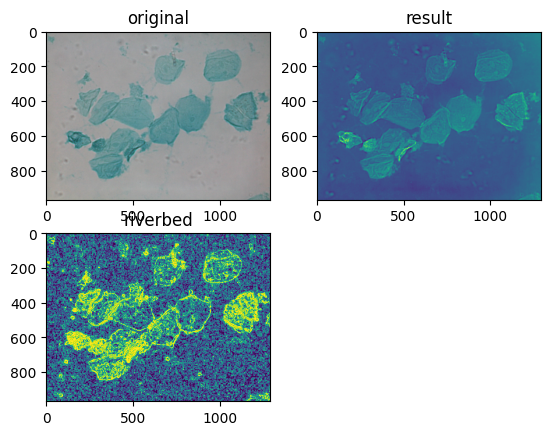

In [7]:
plt.subplot(221),plt.imshow(img),plt.title('original')
plt.subplot(222),plt.imshow(img_result.astype('uint8') * 255),plt.title('result')
plt.subplot(223),plt.imshow(bordas.astype('uint8') * 255),plt.title('riverbed')

In [8]:
def canny_melhorado(imagem, sigma=1.0, low_threshold=0.5, high_threshold=1.0):
  """
  Aplica o filtro de Canny melhorado em uma imagem.

  Args:
      imagem: Matriz NumPy que representa a imagem original.
      sigma: Parâmetro de suavização da imagem (padrão: 1.0).
      low_threshold: Limiar inferior para a supressão de não-máximos (padrão: 0.5).
      high_threshold: Limiar superior para a supressão de não-máximos (padrão: 1.0).

  Returns:
      bordas: Matriz NumPy que representa a imagem com as bordas detectadas.
  """

  # Suavização da imagem
  imagem_suavizada = cv.GaussianBlur(imagem, (5, 5), sigma)

  # Detecção de bordas com o filtro de Canny original
  bordas_canny = cv.Canny(imagem_suavizada, low_threshold, high_threshold)

  # Supressão de não-máximos adaptativos
  bordas = np.zeros_like(bordas_canny)

  for y in range(1, bordas_canny.shape[0] - 1):
    for x in range(1, bordas_canny.shape[1] - 1):
      if bordas_canny[y, x] > 0:
        # Comparar com os vizinhos em 8 direções
        vizinhos = [
          bordas_canny[y - 1, x - 1], bordas_canny[y - 1, x], bordas_canny[y - 1, x + 1],
          bordas_canny[y, x - 1], bordas_canny[y, x + 1],
          bordas_canny[y + 1, x - 1], bordas_canny[y + 1, x], bordas_canny[y + 1, x + 1]
        ]

        # Se for o pixel mais forte em todas as direções, é uma borda real
        if all(bordas_canny[y, x] >= v for v in vizinhos):
          bordas[y, x] = 255

  return bordas_canny

In [9]:
canny = canny_melhorado(img)

(<matplotlib.image.AxesImage at 0x12fcb4d40>, Text(0.5, 1.0, 'cany'))

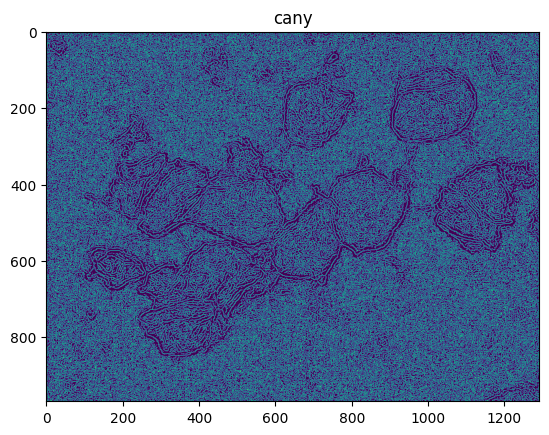

In [10]:
plt.imshow(canny.astype('uint8') * 255),plt.title('cany')

(<Axes: title={'center': 'canny + riverbed + img'}>,
 Text(0.5, 1.0, 'canny + riverbed + img'))

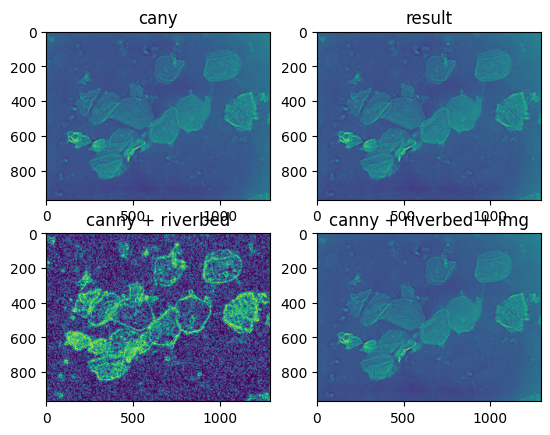

In [11]:
img_canny = canny + gimg
sum_filters = canny + bordas
img_sum_filter = sum_filters + gimg
plt.subplot(221),plt.imshow(img_canny.astype('uint8') * 255),plt.title('cany')
plt.subplot(222),plt.imshow(img_result.astype('uint8') * 255),plt.title('result')
plt.subplot(223),plt.imshow(sum_filters.astype('uint8') * 255),plt.title('canny + riverbed')
plt.subplot(224),plt.imshow(img_sum_filter.astype('uint8') * 255),plt.title('canny + riverbed + img')

(<matplotlib.image.AxesImage at 0x12f18d9a0>,
 Text(0.5, 1.0, 'canny + riverbed + img'))

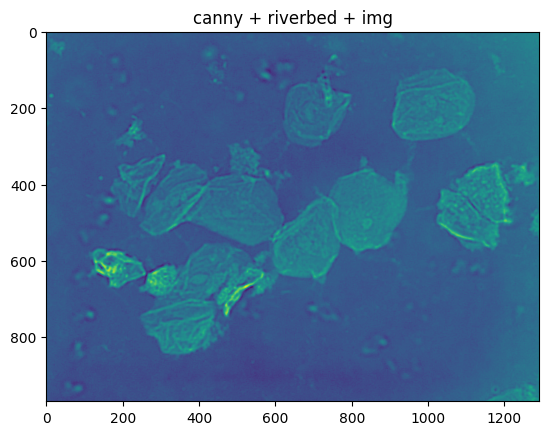

In [12]:
plt.imshow(img_sum_filter.astype('uint8') * 255),plt.title('canny + riverbed + img')

In [13]:
img_in_canny = canny * gimg
canny2 = canny_melhorado(img_in_canny)
img_canny2 = canny2 + gimg + canny

(<matplotlib.image.AxesImage at 0x12fe5e660>, Text(0.5, 1.0, 'canny2'))

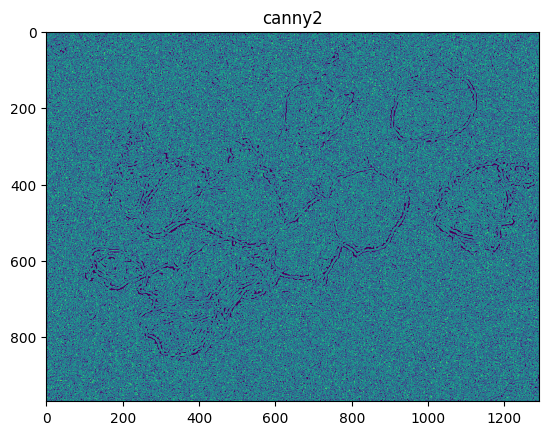

In [14]:
plt.imshow(canny2.astype('uint8') * 255),plt.title('canny2')

(<matplotlib.image.AxesImage at 0x12fea5dc0>, Text(0.5, 1.0, 'canny2 + img'))

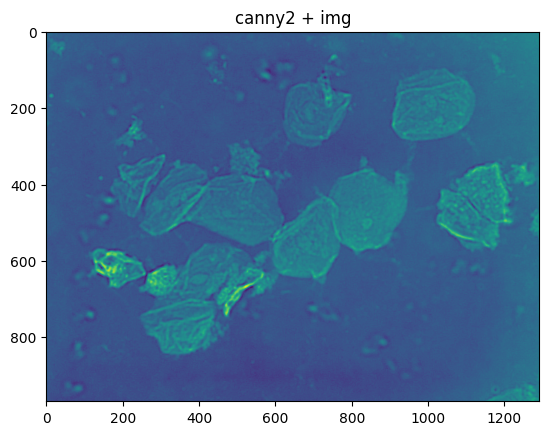

In [15]:
plt.imshow(img_canny2.astype('uint8') * 255),plt.title('canny2 + img')

(<Axes: title={'center': 'sum_filter'}>,
 Text(0.5, 1.0, 'sum_filter'))

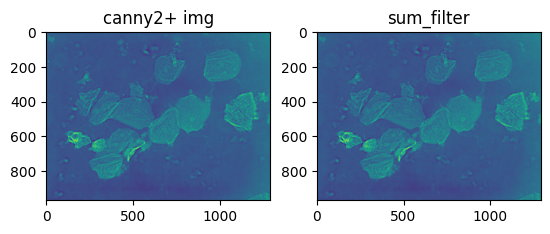

In [16]:
plt.subplot(221),plt.imshow(img_canny2.astype('uint8') * 255),plt.title('canny2+ img')
plt.subplot(222),plt.imshow(img_sum_filter.astype('uint8') * 255),plt.title('sum_filter')

In [17]:
def realce_bordas_gradiente_cor(imagem):
  """
  Realiza o realce de bordas na imagem utilizando gradientes de cor.

  Args:
      imagem: Matriz NumPy que representa a imagem original.

  Returns:
      imagem_bordas: Matriz NumPy que representa a imagem com as bordas realçadas.
  """

  # Converter para o espaço de cores Lab
  img_rgb = cv.cvtColor(imagem, cv.COLOR_GRAY2RGB) 
  imagem_lab = cv.cvtColor(img_rgb, cv.COLOR_BGR2LAB)

  # Separar os canais
  l, a, b = cv.split(imagem_lab)

  # Calcular os gradientes de cada canal
  gl = cv.Sobel(l, cv.CV_64F, 1, 0)
  ga = cv.Sobel(a, cv.CV_64F, 1, 0)
  gb = cv.Sobel(b, cv.CV_64F, 1, 0)

  # Calcular a magnitude do gradiente
  magnitude = np.sqrt(gl**2 + ga**2 + gb**2)

  # Normalizar a magnitude
  magnitude_norm = cv.normalize(magnitude, 0, 255, cv.NORM_MINMAX)

  # Converter para uint8
  imagem_bordas = magnitude_norm.astype('uint8')

  return imagem_bordas

(<Axes: title={'center': 'realce por gradiente'}>,
 Text(0.5, 1.0, 'realce por gradiente'))

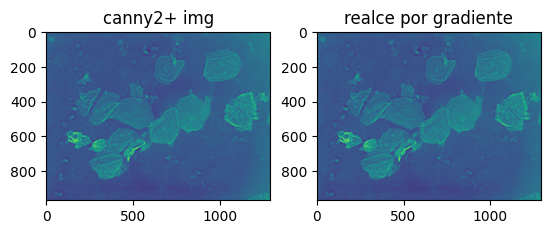

In [18]:
imagem_bordas = realce_bordas_gradiente_cor(img_canny2)
img3 = img_canny2 + imagem_bordas
plt.subplot(221),plt.imshow(img_canny2.astype('uint8') * 255),plt.title('canny2+ img')
plt.subplot(222),plt.imshow(img3.astype('uint8') * 255),plt.title('realce por gradiente')

In [19]:
def segmentacao_watershed(imagem):
  """
  Realiza a segmentação de imagem utilizando o algoritmo de Watershed.

  Args:
      imagem: Matriz NumPy que representa a imagem original.

  Returns:
      imagem_segmentada: Matriz NumPy que representa a imagem segmentada, onde cada pixel é atribuído a uma região distinta.
      marcas: Matriz NumPy que representa as marcas das bacias hidrográficas.
  """

  # Converter para escala de cinza
  
  #img_rgb = cv.cvtColor(imagem, cv.COLOR_GRAY2BGR) 
  imagem_cinza = cv.cvtColor(imagem, cv.COLOR_RGB2GRAY) 
  #print(img_rgb.shape)
  #print (img_rgb.dtype)
  # Inverter os valores de intensidade (fundo branco, objetos pretos)
  imagem_invertida = 255 - imagem_cinza

  # Aplicar o filtro de dilatação para aumentar o tamanho dos objetos
  kernel = np.ones((3, 3), dtype=np.uint8)
  imagem_dilatada = cv.dilate(imagem_invertida, kernel, iterations=3)

  # Distância de transformação
  dist = cv.distanceTransform(imagem_dilatada, cv.DIST_C, 5)

  # Normalizar a distância
  dist_norm = cv.normalize(dist, 0, 255, cv.NORM_MINMAX)

   # Encontrar contornos
  bordas, hierarquia = cv.findContours(imagem_invertida, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

  # Criar a imagem de marcas
  marcas = np.zeros_like(imagem_invertida)
  #np.resize(marcas
  marcas_rgb = marcas.astype('int32') 
  print(marcas_rgb.shape)
  print (marcas_rgb.dtype)
  # Desenhar os contornos como marcas
  for i, contorno in enumerate(bordas):
    cv.drawContours(marcas, [contorno], -1, (i + 1) * 255, -1)


  # Segmentação
  imagem_segmentada = cv.watershed(imagem, marcas_rgb)

  return imagem_segmentada, marcas

In [20]:
print(img3.shape)
imagem_saida = cv.cvtColor(img3, cv.COLOR_GRAY2RGB)
cv.imwrite('imagem_saida.jpg', imagem_saida.astype('uint8') * 255)
imagem = cv.imread('imagem_saida.jpg')
imagem_segmentada, marcas = segmentacao_watershed(imagem)

(968, 1292)
(968, 1292)
int32


(<Axes: title={'center': 'realce por gradiente'}>,
 Text(0.5, 1.0, 'realce por gradiente'))

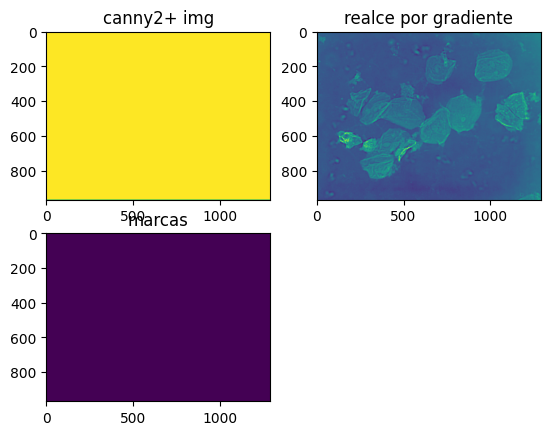

In [21]:
plt.subplot(221),plt.imshow(imagem_segmentada),plt.title('canny2+ img')
plt.subplot(223),plt.imshow(marcas),plt.title('marcas')
plt.subplot(222),plt.imshow(img3.astype('uint8') * 255),plt.title('realce por gradiente')

(<Axes: title={'center': 'canny2'}>,
 Text(0.5, 1.0, 'canny2'))

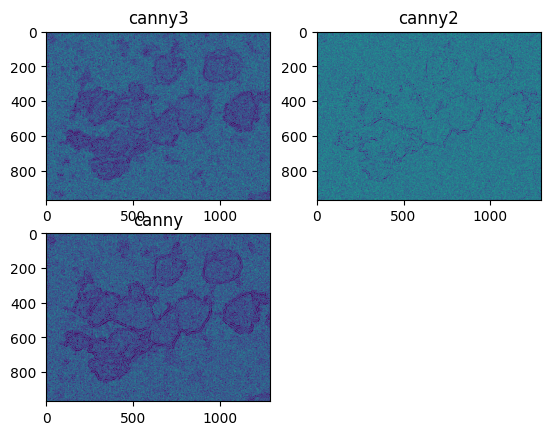

In [22]:
img4 = canny_melhorado(img3)

plt.subplot(221),plt.imshow(img4),plt.title('canny3')
plt.subplot(223),plt.imshow(canny),plt.title('canny')
plt.subplot(222),plt.imshow(canny2.astype('uint8') * 255),plt.title('canny2')

In [23]:
def filtro_espacial_realce_bordas(imagem):
    """
    Aplica um filtro espacial para realce de bordas em uma imagem.

    Args:
        imagem (numpy.ndarray): Matriz de imagem RGB.

    Returns:
        numpy.ndarray: Matriz de imagem com bordas realçadas.
    """

    # Converter a imagem para escala de cinza
    imagem_cinza = imagem

    # Aplicar o filtro Laplace
    laplaciana = cv.Laplacian(imagem_cinza, cv.CV_64F)

    # Converter a matriz de Laplace para valores positivos
    laplaciana_positiva = np.abs(laplaciana)

    # Normalizar a matriz de Laplace para o intervalo [0, 255]
    laplaciana_normalizada = laplaciana_positiva * (255 / laplaciana_positiva.max())

    # Converter a matriz normalizada para tipo `uint8`
    imagem_com_bordas = laplaciana_normalizada.astype(np.uint8)

    return imagem_com_bordas

(<Axes: title={'center': 'canny2'}>,
 Text(0.5, 1.0, 'canny2'))

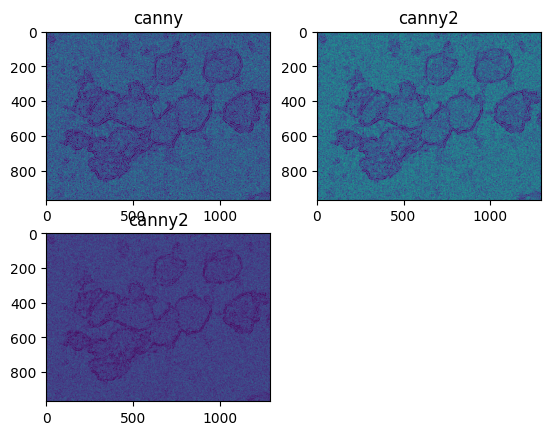

In [24]:
imagem_com_bordas = filtro_espacial_realce_bordas(canny)
plt.subplot(222),plt.imshow(imagem_com_bordas),plt.title('canny2')
plt.subplot(221),plt.imshow(canny),plt.title('canny')
imagem_com_bordas2 = filtro_espacial_realce_bordas(imagem_com_bordas)
plt.subplot(223),plt.imshow(imagem_com_bordas2),plt.title('canny2')

In [25]:
def realce_bordas_por_cor_com_supressao_nao_maxima_alternativa_2(imagem):
    """
    Realiza o realce de bordas por cor com supressão não máxima (alternativa).

    Args:
        imagem (numpy.ndarray): Matriz de imagem RGB.

    Returns:
        numpy.ndarray: Matriz de imagem com bordas realçadas.
    """

    # Converter a imagem para o espaço de cor Lab
    imagem_lab = cv.cvtColor(imagem, cv.COLOR_BGR2LAB)

    # Separar os componentes L*a*b
    canal_l, canal_a, canal_b = cv.split(imagem_lab)

    # Calcular os gradientes horizontais e verticais usando o filtro Sobel
    sobel_x = cv.Sobel(canal_l, cv.CV_64F, 1, 0)
    sobel_y = cv.Sobel(canal_l, cv.CV_64F, 0, 1)

    # Calcular a magnitude do gradiente e a direção da borda
    magnitude = np.hypot(sobel_x, sobel_y)
    direcao = np.arctan2(sobel_y, sobel_x) * 180 / np.pi

    # Converter a magnitude e a direção para tipos de dados apropriados
    magnitude = magnitude.astype(np.uint8)
    direcao = direcao.astype(np.int32)

    # Criar elementos estruturais para supressão não máxima
    elemento_estrutural_1 = np.array([
        [0, 0, 0],
        [0, 1, 0],
        [0, 0, 0]
    ])

    elemento_estrutural_2 = np.array([
        [0, 1, 0],
        [0, 1, 0],
        [0, 1, 0]
    ])

    elemento_estrutural_3 = np.array([
        [0, 0, 0],
        [1, 1, 1],
        [0, 0, 0]
    ])

    elemento_estrutural_4 = np.array([
        [0, 1, 0],
        [1, 1, 1],
        [0, 1, 0]
    ])

    # Aplicar supressão não máxima em diferentes direções
    bordas_orientadas_1 = cv.morphologyEx(magnitude, cv.MORPH_ERODE, elemento_estrutural_1)
    bordas_orientadas_2 = cv.morphologyEx(magnitude, cv.MORPH_ERODE, elemento_estrutural_2)
    bordas_orientadas_3 = cv.morphologyEx(magnitude, cv.MORPH_ERODE, elemento_estrutural_3)
    bordas_orientadas_4 = cv.morphologyEx(magnitude, cv.MORPH_ERODE, elemento_estrutural_4)

    # Combinar os resultados da supressão não máxima
    bordas_orientadas_com_supressao = bordas_orientadas_1 | bordas_orientadas_2 | \
                                       bordas_orientadas_3 | bordas_orientadas_4

    # Limiarizar a magnitude da borda para obter pixels de borda binária
    limiar = 50  # Ajustar este valor para controlar a sensibilidade da detecção de bordas
    bordas_binarias = magnitude > limiar

    # Combinar a imagem em escala de cinza com as bordas binárias
    imagem_com_bordas = np.bitwise_and(imagem, imagem, mask=bordas_binarias)

    return imagem_com_bordas

In [27]:
#imagem_com_bordas = realce_bordas_por_cor_com_supressao_nao_maxima_alternativa_2(img)

In [28]:
def filtro_bilateral(imagem, d=9, sigmaColor=75, sigmaSpace=75):
  """
  Aplica o filtro bilateral na imagem.

  Args:
      imagem: Matriz NumPy que representa a imagem original.
      d: Diâmetro do kernel (padrão: 9).
      sigmaColor: Sigma de cor (padrão: 75).
      sigmaSpace: Sigma de espaço (padrão: 75).

  Returns:
      imagem_filtrada: Matriz NumPy que representa a imagem com o filtro aplicado.
  """

  # Converter a imagem para o espaço de cores BGR
  imagem_bgr = cv.cvtColor(imagem, cv.COLOR_BGR2BGRA)

  # Aplicar o filtro bilateral
  imagem_filtrada = cv.bilateralFilter(imagem, d, sigmaColor, sigmaSpace)

  # Converter de volta para BGR
  #imagem_filtrada = cv.cvtColor(imagem_filtrada, cv.COLOR_BGRA2BGR)

  return imagem_filtrada

In [29]:
imagem_filtrada = filtro_bilateral(canny2)
img_filt_canny2 = imagem_filtrada + gimg + canny

(<Axes: title={'center': 'sum_filter'}>,
 Text(0.5, 1.0, 'sum_filter'))

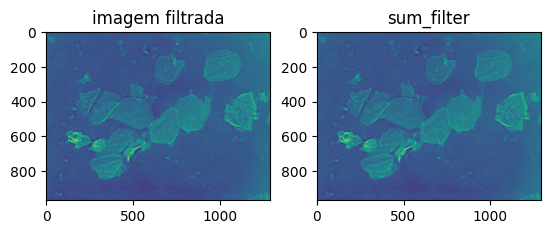

In [30]:

plt.subplot(221),plt.imshow(img_canny2.astype('uint8') * 255),plt.title('imagem filtrada')
plt.subplot(222),plt.imshow(img_filt_canny2.astype('uint8') * 255),plt.title('sum_filter')

##unsharp

In [31]:
kernel = np.array([
    [1, 2, 1],
    [2, -4, 2],
    [1, 2, 1]
])

def unsharp_masking(imagem, kernel_size=(5, 5), sigma=1.0, amount=0.3, threshold=0):
  """
  Aplica o filtro Unsharp Masking em uma imagem.

  Args:
      imagem: Matriz NumPy que representa a imagem original.
      kernel_size: Tamanho do kernel do filtro (padrão: (5, 5)).
      sigma: Parâmetro de suavização do kernel (padrão: 1.0).
      amount: Fator de realce (entre 0 e 1).
      threshold: Limiar para a criação da máscara (padrão: 0).

  Returns:
      imagem_afiada: Matriz NumPy que representa a imagem com o filtro aplicado.
  """

  # Criar o kernel
  kernel = cv.getGaussianKernel(5, sigma)
  kernel_x = kernel.copy()
  kernel_x[1, :] = -1

  # Aplicar o filtro
  imagem_derivada_x = cv.filter2D(imagem, ddepth=cv.CV_32F, kernel=kernel_x)
  imagem_derivada_y = cv.filter2D(imagem, ddepth=cv.CV_32F, kernel=kernel.T)

  # Magnitude do gradiente
  magnitude = cv.magnitude(imagem_derivada_x, imagem_derivada_y)

  # Criar a máscara
  mask = np.ones_like(magnitude)
  mask[magnitude < threshold] = 0

  # Realce de bordas
  imagem_afiada = imagem + amount * (magnitude - threshold) * mask

  # Limitar valores de pixel
  imagem_afiada = np.clip(imagem_afiada, 0, 255)

  return imagem_afiada


In [32]:
imagem_afiada = unsharp_masking(img_canny2)

(<matplotlib.image.AxesImage at 0x12ff014c0>, Text(0.5, 1.0, 'unsharp'))

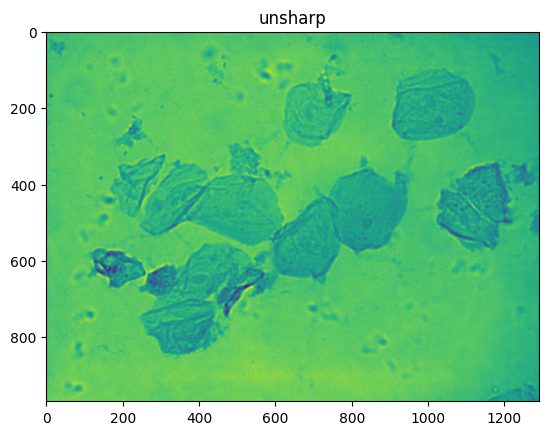

In [33]:
plt.imshow(imagem_afiada),plt.title('unsharp')

In [34]:
def detail_enhance(imagem):
  """
  Aplica o filtro cv2.detailEnhance() em uma imagem.

  Args:
      imagem: Matriz NumPy que representa a imagem original.

  Returns:
      imagem_afiada: Matriz NumPy que representa a imagem com o filtro aplicado.
  """

  # Converter a imagem para o espaço de cores Lab
  img_rgb = cv.cvtColor(imagem, cv.COLOR_GRAY2RGB)  
  imagem_lab = cv.cvtColor(img_rgb, cv.COLOR_BGR2LAB)

  # Separar os canais
  l, a, b = cv.split(imagem_lab)

  # Aplicar o filtro detailEnhance() no canal de luminância
  imagem_lab_afiada = cv.detailEnhance(imagem_lab, 42, 0.02)

  # Combinar os canais e converter de volta para BGR
  #imagem_lab_afiada = cv.merge((l_afiado, a, b))
  imagem_afiada = cv.cvtColor(imagem_lab_afiada, cv.COLOR_LAB2BGR)

  return imagem_afiada

(<matplotlib.image.AxesImage at 0x14f92bcb0>, Text(0.5, 1.0, 'unsharp2'))

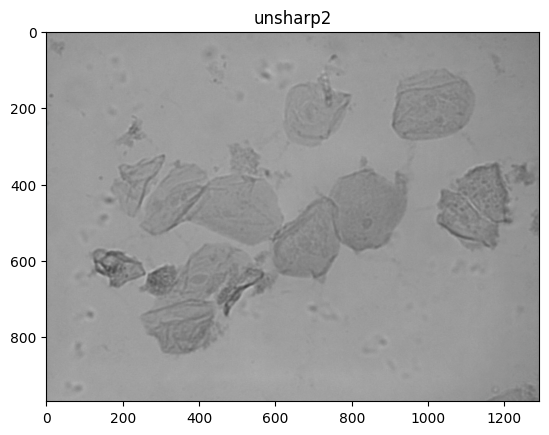

In [35]:
imagem_afiada2 = detail_enhance(img_canny2)
plt.imshow(imagem_afiada2),plt.title('unsharp2')

(<matplotlib.image.AxesImage at 0x14f8c94c0>, Text(0.5, 1.0, 'unsharp2'))

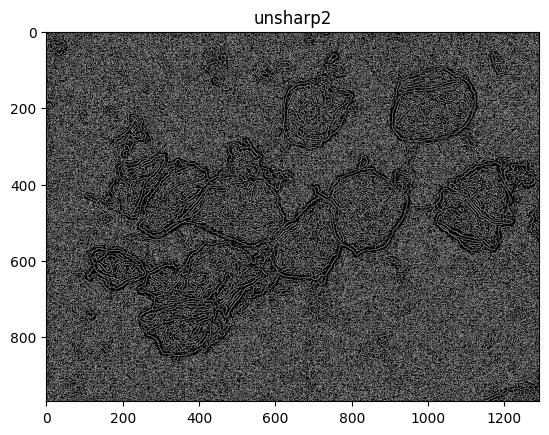

In [36]:
imagem_afiada3 = detail_enhance(canny)
plt.imshow(imagem_afiada3),plt.title('unsharp2')

(<matplotlib.image.AxesImage at 0x14ad58aa0>, Text(0.5, 1.0, 'unsharp2'))

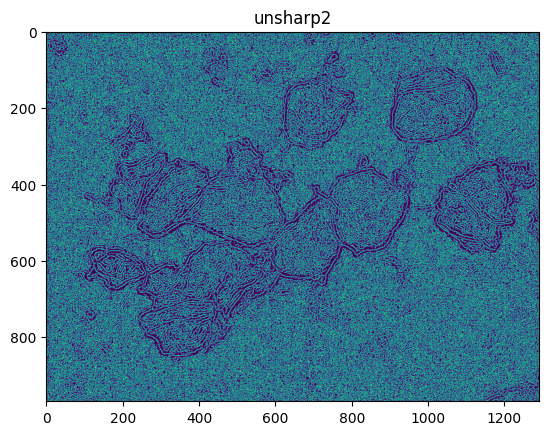

In [37]:
imagem_afiada4 = unsharp_masking(canny)
plt.imshow(imagem_afiada4),plt.title('unsharp2')

(<matplotlib.image.AxesImage at 0x14f9db560>, Text(0.5, 1.0, 'unsharp2'))

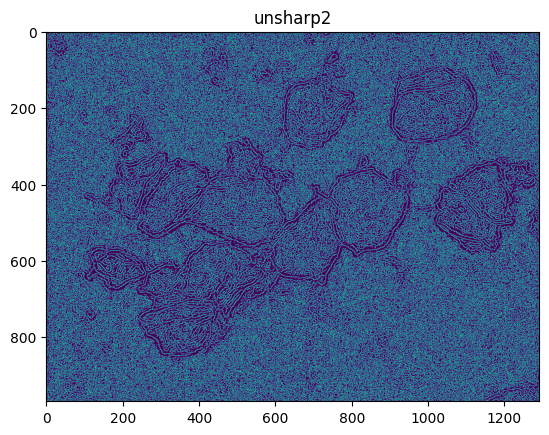

In [38]:
plt.imshow(canny),plt.title('unsharp2')

(<matplotlib.image.AxesImage at 0x14f9b9af0>, Text(0.5, 1.0, 'unsharp2'))

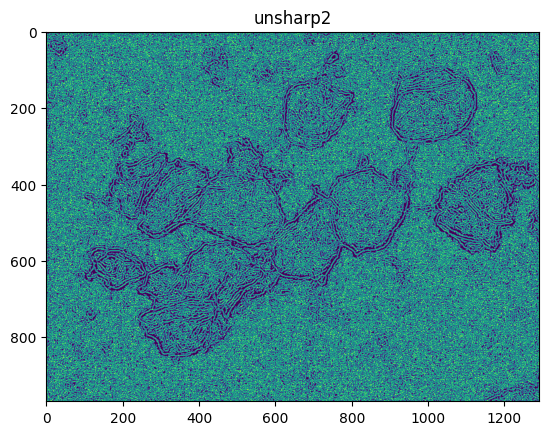

In [39]:
imagem_afiada5 = unsharp_masking(imagem_afiada4)
plt.imshow(imagem_afiada5),plt.title('unsharp2')

(<matplotlib.image.AxesImage at 0x14f9cac00>, Text(0.5, 1.0, 'unsharp2'))

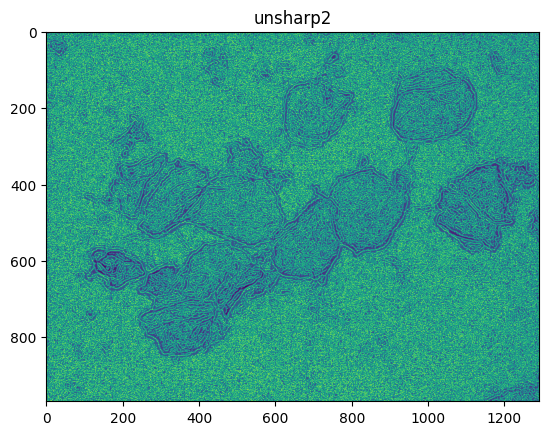

In [40]:
img_result = gimg + imagem_afiada5
plt.imshow(img_result),plt.title('unsharp2')

In [41]:
cv.imwrite('imagem_saida.jpg', img_result)

True

In [42]:
imagem_suavizada = cv.GaussianBlur(img_result, (5, 5), 1.0)

(<matplotlib.image.AxesImage at 0x15fee3a70>, Text(0.5, 1.0, 'unsharp2'))

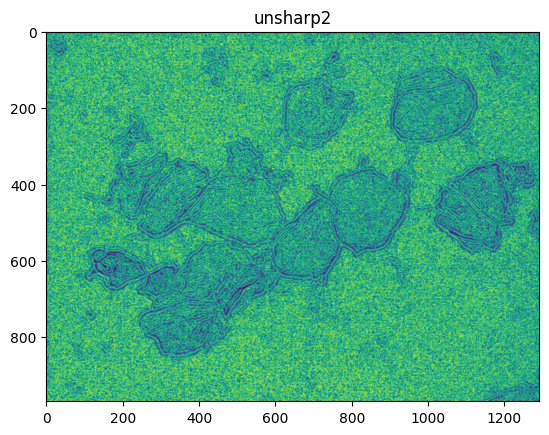

In [43]:
plt.imshow(imagem_suavizada),plt.title('unsharp2')

(<matplotlib.image.AxesImage at 0x16b30a7b0>, Text(0.5, 1.0, 'unsharp2'))

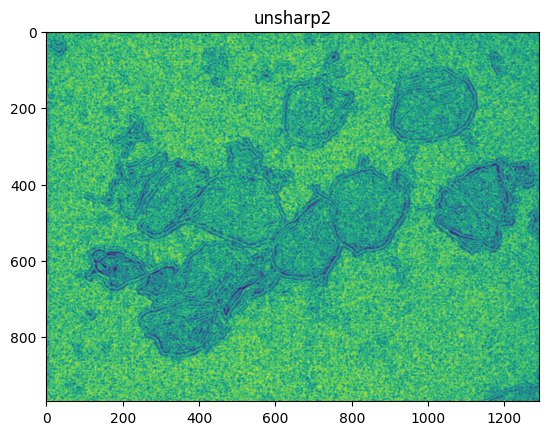

In [44]:
imagem_suavizada2 = cv.GaussianBlur(imagem_suavizada, (5, 5), 1.0)
plt.imshow(imagem_suavizada2),plt.title('unsharp2')

(<matplotlib.image.AxesImage at 0x15ff18050>, Text(0.5, 1.0, 'unsharp2'))

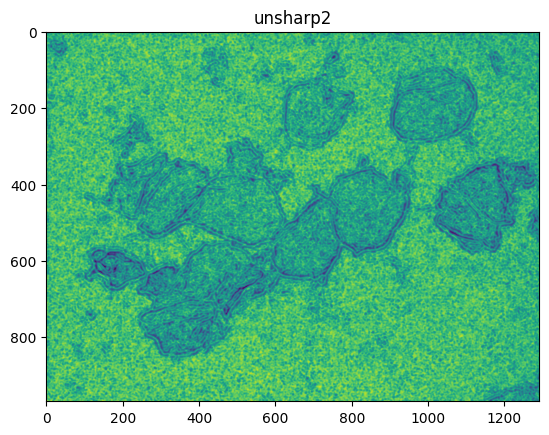

In [45]:
imagem_suavizada3 = cv.GaussianBlur(imagem_suavizada2, (5, 5), 1.0)
plt.imshow(imagem_suavizada3),plt.title('unsharp2')

(<matplotlib.image.AxesImage at 0x16b3f27b0>, Text(0.5, 1.0, 'unsharp2'))

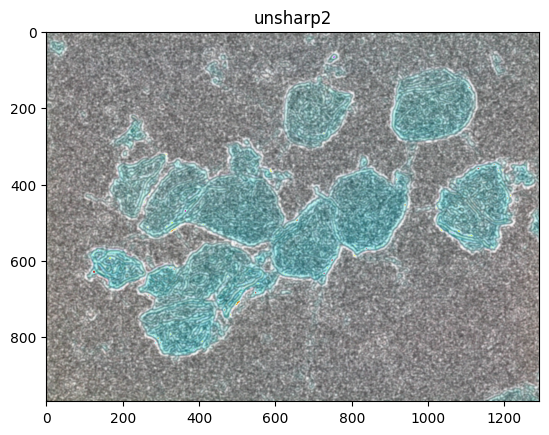

In [46]:
img_ralc_rgb = cv.cvtColor(imagem_suavizada3.astype('uint8') * 255, cv.COLOR_GRAY2BGR)
imagem_suavizada4 = img_ralc_rgb + img
#imagem_suavizada5 = cv.GaussianBlur(imagem_suavizada4, (5, 5), 1.0)
plt.imshow(imagem_suavizada4),plt.title('unsharp2')
#plt.imshow(imagem_suavizada4),plt.title('unsharp2')

In [47]:
cv.imwrite('img_realc.jpg', imagem_suavizada3.astype('uint8') * 255)
cv.imwrite('img_in.jpg', gimg.astype('uint8') * 255)

True

In [48]:
cv.imwrite('img_realc2.jpg', imagem_suavizada4.astype('uint8') * 255)

True

In [162]:
imagem_segmentada, marcas = segmentacao_watershed(imagem_suavizada4)

(968, 1292)
int32


##histograma 

(968, 1292, 3)


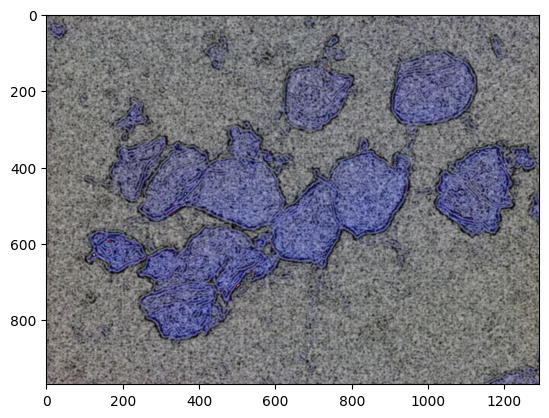

In [50]:
import cv2 as cv
import numpy as np
import io
from matplotlib import pyplot as plt
import math

imgHist = plt.imread('histogram/img_saida.jpg')
imgHistIn = plt.imread('histogram/A1 - P10.jpg')

imgHist2 = plt.imread('histogram/img_realc4.jpg')
imgHistIn2 = plt.imread('histogram/E19 - P45.jpg')

imgHist3 = plt.imread('histogram/img_realc2.jpg')
imgHistIn3 = plt.imread('histogram/E19 - P20.jpg')

print(imgHist.shape)
assert imgHist is not None, "file could not be read, check with os.path.exists()"
plt.imshow(imgHist)

In [51]:
hist = cv.calcHist([imgHist],[0], None, [256], [0, 255])
histIn = cv.calcHist([imgHistIn],[0], None, [256], [0, 255])

b_hist = cv.calcHist(imgHist, [0], None, [256], [0, 255], accumulate=False)
g_hist = cv.calcHist(imgHist, [1], None, [256], [0, 255], accumulate=False)
r_hist = cv.calcHist(imgHist, [2], None, [256], [0, 255], accumulate=False)

b_histIn = cv.calcHist(imgHistIn, [0], None, [256], [0, 255], accumulate=False)
g_histIn = cv.calcHist(imgHistIn, [1], None, [256], [0, 255], accumulate=False)
r_histIn = cv.calcHist(imgHistIn, [2], None, [256], [0, 255], accumulate=False)
###################################################################################

b_hist2 = cv.calcHist(imgHist2, [0], None, [256], [0, 255], accumulate=False)
g_hist2 = cv.calcHist(imgHist2, [1], None, [256], [0, 255], accumulate=False)
r_hist2 = cv.calcHist(imgHist2, [2], None, [256], [0, 255], accumulate=False)

b_histIn2 = cv.calcHist(imgHistIn2, [0], None, [256], [0, 255], accumulate=False)
g_histIn2 = cv.calcHist(imgHistIn2, [1], None, [256], [0, 255], accumulate=False)
r_histIn2 = cv.calcHist(imgHistIn2, [2], None, [256], [0, 255], accumulate=False)
###################################################################################

b_hist3 = cv.calcHist(imgHist3, [0], None, [256], [0, 255], accumulate=False)
g_hist3 = cv.calcHist(imgHist3, [1], None, [256], [0, 255], accumulate=False)
r_hist3 = cv.calcHist(imgHist3, [2], None, [256], [0, 255], accumulate=False)

b_histIn3 = cv.calcHist(imgHistIn3, [0], None, [256], [0, 255], accumulate=False)
g_histIn3 = cv.calcHist(imgHistIn3, [1], None, [256], [0, 255], accumulate=False)
r_histIn3 = cv.calcHist(imgHistIn3, [2], None, [256], [0, 255], accumulate=False)

/var/folders/w6/26v1cd9142s5h4lqlvz_zqpr0000gn/T/ipykernel_2533/1433596955.py:9: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cv.line(histImage, ( bin_w*(i-1), hist_h - int(b_hist[i-1]) ),
/var/folders/w6/26v1cd9142s5h4lqlvz_zqpr0000gn/T/ipykernel_2533/1433596955.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ( bin_w*(i), hist_h - int(b_hist[i]) ),
/var/folders/w6/26v1cd9142s5h4lqlvz_zqpr0000gn/T/ipykernel_2533/1433596955.py:12: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecate

(<Axes: title={'center': 'in'}>,
 Text(0.5, 1.0, 'in'))

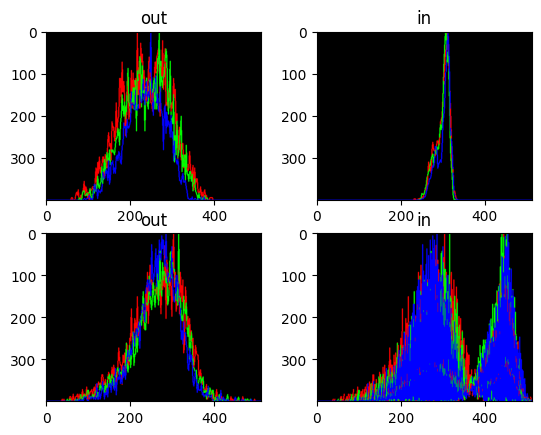

In [53]:
hist_h = 400
hist_w = 512
bin_w = int(round( hist_w/255 ))
cv.normalize(b_hist, b_hist, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
cv.normalize(g_hist, g_hist, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
cv.normalize(r_hist, r_hist, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
histImage = np.zeros((hist_h, hist_w, 3), dtype=np.uint8)
for i in range(1, 256):
 cv.line(histImage, ( bin_w*(i-1), hist_h - int(b_hist[i-1]) ),
 ( bin_w*(i), hist_h - int(b_hist[i]) ),
 ( 255, 0, 0), thickness=2)
 cv.line(histImage, ( bin_w*(i-1), hist_h - int(g_hist[i-1]) ),
 ( bin_w*(i), hist_h - int(g_hist[i]) ),
 ( 0, 255, 0), thickness=2)
 cv.line(histImage, ( bin_w*(i-1), hist_h - int(r_hist[i-1]) ),
 ( bin_w*(i), hist_h - int(r_hist[i]) ),
 ( 0, 0, 255), thickness=2)



cv.normalize(b_histIn, b_histIn, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
cv.normalize(g_histIn, g_histIn, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
cv.normalize(r_histIn, r_histIn, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
histImageIn = np.zeros((hist_h, hist_w, 3), dtype=np.uint8)
for i in range(1, 256):
 cv.line(histImageIn, ( bin_w*(i-1), hist_h - int(b_histIn[i-1]) ),
 ( bin_w*(i), hist_h - int(b_histIn[i]) ),
 ( 255, 0, 0), thickness=2)
 cv.line(histImageIn, ( bin_w*(i-1), hist_h - int(g_histIn[i-1]) ),
 ( bin_w*(i), hist_h - int(g_histIn[i]) ),
 ( 0, 255, 0), thickness=2)
 cv.line(histImageIn, ( bin_w*(i-1), hist_h - int(r_histIn[i-1]) ),
 ( bin_w*(i), hist_h - int(r_histIn[i]) ),
 ( 0, 0, 255), thickness=2)
###################################################################################

cv.normalize(b_hist2, b_hist2, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
cv.normalize(g_hist2, g_hist2, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
cv.normalize(r_hist2, r_hist2, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
histImage2 = np.zeros((hist_h, hist_w, 3), dtype=np.uint8)
for i in range(1, 256):
 cv.line(histImage2, ( bin_w*(i-1), hist_h - int(b_hist2[i-1]) ),
 ( bin_w*(i), hist_h - int(b_hist2[i]) ),
 ( 255, 0, 0), thickness=2)
 cv.line(histImage2, ( bin_w*(i-1), hist_h - int(g_hist2[i-1]) ),
 ( bin_w*(i), hist_h - int(g_hist2[i]) ),
 ( 0, 255, 0), thickness=2)
 cv.line(histImage2, ( bin_w*(i-1), hist_h - int(r_hist2[i-1]) ),
 ( bin_w*(i), hist_h - int(r_hist2[i]) ),
 ( 0, 0, 255), thickness=2)



cv.normalize(b_histIn2, b_histIn2, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
cv.normalize(g_histIn2, g_histIn2, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
cv.normalize(r_histIn2, r_histIn2, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
histImageIn2 = np.zeros((hist_h, hist_w, 3), dtype=np.uint8)
for i in range(1, 256):
 cv.line(histImageIn2, ( bin_w*(i-1), hist_h - int(b_histIn2[i-1]) ),
 ( bin_w*(i), hist_h - int(b_hist2[i]) ),
 ( 255, 0, 0), thickness=2)
 cv.line(histImageIn2, ( bin_w*(i-1), hist_h - int(g_histIn2[i-1]) ),
 ( bin_w*(i), hist_h - int(g_hist2[i]) ),
 ( 0, 255, 0), thickness=2)
 cv.line(histImageIn2, ( bin_w*(i-1), hist_h - int(r_histIn2[i-1]) ),
 ( bin_w*(i), hist_h - int(r_hist2[i]) ),
 ( 0, 0, 255), thickness=2)

plt.subplot(221),plt.imshow(histImage),plt.title('out')
plt.subplot(222),plt.imshow(histImageIn),plt.title('in')

plt.subplot(223),plt.imshow(histImage2),plt.title('out')
plt.subplot(224),plt.imshow(histImageIn2),plt.title('in')
###################################################################################

cv.normalize(b_hist3, b_hist3, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
cv.normalize(g_hist3, g_hist3, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
cv.normalize(r_hist3, r_hist3, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
histImage3 = np.zeros((hist_h, hist_w, 3), dtype=np.uint8)
for i in range(1, 256):
 cv.line(histImage3, ( bin_w*(i-1), hist_h - int(b_hist3[i-1]) ),
 ( bin_w*(i), hist_h - int(b_hist3[i]) ),
 ( 255, 0, 0), thickness=2)
 cv.line(histImage3, ( bin_w*(i-1), hist_h - int(g_hist3[i-1]) ),
 ( bin_w*(i), hist_h - int(g_hist3[i]) ),
 ( 0, 255, 0), thickness=2)
 cv.line(histImage3, ( bin_w*(i-1), hist_h - int(r_hist3[i-1]) ),
 ( bin_w*(i), hist_h - int(r_hist3[i]) ),
 ( 0, 0, 255), thickness=2)



cv.normalize(b_histIn3, b_histIn3, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
cv.normalize(g_histIn3, g_histIn3, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
cv.normalize(r_histIn3, r_histIn3, alpha=0, beta=hist_h, norm_type=cv.NORM_MINMAX)
histImageIn3 = np.zeros((hist_h, hist_w, 3), dtype=np.uint8)
for i in range(1, 256):
 cv.line(histImageIn3, ( bin_w*(i-1), hist_h - int(b_histIn3[i-1]) ),
 ( bin_w*(i), hist_h - int(b_hist3[i]) ),
 ( 255, 0, 0), thickness=2)
 cv.line(histImageIn3, ( bin_w*(i-1), hist_h - int(g_histIn3[i-1]) ),
 ( bin_w*(i), hist_h - int(g_hist3[i]) ),
 ( 0, 255, 0), thickness=2)
 cv.line(histImageIn3, ( bin_w*(i-1), hist_h - int(r_histIn3[i-1]) ),
 ( bin_w*(i), hist_h - int(r_hist3[i]) ),
 ( 0, 0, 255), thickness=2)

plt.subplot(221),plt.imshow(histImage),plt.title('out')
plt.subplot(222),plt.imshow(histImageIn),plt.title('in')

plt.subplot(223),plt.imshow(histImage2),plt.title('out')
plt.subplot(224),plt.imshow(histImageIn2),plt.title('in')




(<Axes: title={'center': 'in'}>,
 Text(0.5, 1.0, 'in'))

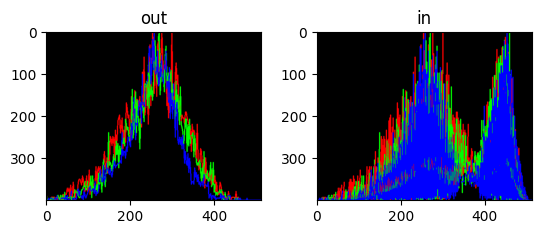

In [54]:
plt.subplot(221),plt.imshow(histImage3),plt.title('out')
plt.subplot(222),plt.imshow(histImageIn3),plt.title('in')

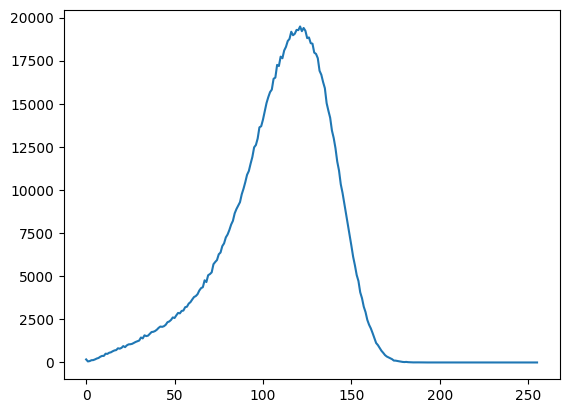

In [8]:
plt.plot(hist)